#

In [ ]:
import torch

print("CUDA available:", torch.cuda.is_available())
print("GPU count:", torch.cuda.device_count())

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}:", torch.cuda.get_device_name(i))

CUDA available: True
GPU count: 2
GPU 0: Tesla T4
GPU 1: Tesla T4


In [ ]:
!pip install -q kagglehub

import kagglehub
from pathlib import Path

# Download MVTec AD directly from Kaggle
mvtec_path = kagglehub.dataset_download(
    "ipythonx/mvtec-ad"
)

MVTEC_PATH = Path(mvtec_path)

print("=" * 60)
print("MVTec AD")
print("=" * 60)

print("Path:", MVTEC_PATH)
print("Exists:", MVTEC_PATH.exists())

categories = sorted([
    p.name
    for p in MVTEC_PATH.iterdir()
    if p.is_dir()
])

print("Categories:", len(categories))
print(categories)

assert len(categories) == 15

print("\nMVTec AD READY")

MVTec AD
Path: /kaggle/input/datasets/ipythonx/mvtec-ad
Exists: True
Categories: 15
['bottle', 'cable', 'capsule', 'carpet', 'grid', 'hazelnut', 'leather', 'metal_nut', 'pill', 'screw', 'tile', 'toothbrush', 'transistor', 'wood', 'zipper']

MVTec AD READY


In [ ]:
# ============================================================
# KAGGLE RECOVERY
# BUILD FULL 15-CATEGORY YOLO SEGMENTATION DATASET
# ============================================================

import cv2
import yaml
import shutil
import random
import numpy as np

from pathlib import Path
from collections import defaultdict
from sklearn.model_selection import train_test_split


# ============================================================
# SETTINGS
# ============================================================

SEED = 42

random.seed(SEED)
np.random.seed(SEED)

ALL_CATEGORIES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper"
]

YOLO_DIR_15 = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat"
)

print("=" * 70)
print("KAGGLE FULL DATASET RECOVERY")
print("=" * 70)

print("MVTec path :", MVTEC_PATH)
print("YOLO path  :", YOLO_DIR_15)


# ============================================================
# 1. COLLECT ALL DEFECTIVE IMAGES + MASKS
# ============================================================

all_defective_samples = []
missing_masks = []

for category in ALL_CATEGORIES:

    category_path = MVTEC_PATH / category

    test_dir = category_path / "test"
    gt_dir = category_path / "ground_truth"

    defect_types = sorted([
        p.name
        for p in test_dir.iterdir()
        if p.is_dir() and p.name != "good"
    ])

    for defect_type in defect_types:

        image_dir = test_dir / defect_type
        mask_dir = gt_dir / defect_type

        for image_path in sorted(
            image_dir.glob("*.png")
        ):

            mask_path = (
                mask_dir /
                f"{image_path.stem}_mask.png"
            )

            if not mask_path.exists():

                missing_masks.append(
                    str(mask_path)
                )

                continue

            all_defective_samples.append({
                "category": category,
                "defect_type": defect_type,
                "image": image_path,
                "mask": mask_path
            })


print("\nDefective images :", len(all_defective_samples))
print("Missing masks    :", len(missing_masks))

assert len(all_defective_samples) == 1258
assert len(missing_masks) == 0


# ============================================================
# 2. COLLECT TRAIN/GOOD
# ============================================================

good_by_category = defaultdict(list)

for category in ALL_CATEGORIES:

    good_dir = (
        MVTEC_PATH /
        category /
        "train" /
        "good"
    )

    good_by_category[category] = sorted(
        good_dir.glob("*.png")
    )


total_available_good = sum(
    len(v)
    for v in good_by_category.values()
)

print(
    "Available train/good:",
    total_available_good
)

assert total_available_good == 3629


# ============================================================
# 3. SELECT 1,258 GOOD IMAGES
# ============================================================

TARGET_GOOD = len(
    all_defective_samples
)

base_per_category = (
    TARGET_GOOD //
    len(ALL_CATEGORIES)
)

remainder = (
    TARGET_GOOD %
    len(ALL_CATEGORIES)
)

selected_good_samples = []

random.seed(SEED)

for i, category in enumerate(
    ALL_CATEGORIES
):

    target = (
        base_per_category +
        (1 if i < remainder else 0)
    )

    available = (
        good_by_category[category]
    )

    n_select = min(
        target,
        len(available)
    )

    selected = random.sample(
        available,
        n_select
    )

    for image_path in selected:

        selected_good_samples.append({
            "category": category,
            "defect_type": "good",
            "image": image_path,
            "mask": None
        })


# Fill any shortage
selected_paths = {
    str(s["image"])
    for s in selected_good_samples
}

remaining_needed = (
    TARGET_GOOD -
    len(selected_good_samples)
)

if remaining_needed > 0:

    remaining_pool = []

    for category in ALL_CATEGORIES:

        for image_path in (
            good_by_category[category]
        ):

            if (
                str(image_path)
                not in selected_paths
            ):

                remaining_pool.append(
                    (category, image_path)
                )

    extra = random.sample(
        remaining_pool,
        remaining_needed
    )

    for category, image_path in extra:

        selected_good_samples.append({
            "category": category,
            "defect_type": "good",
            "image": image_path,
            "mask": None
        })


print(
    "Selected good     :",
    len(selected_good_samples)
)

assert len(
    selected_good_samples
) == 1258


# ============================================================
# 4. SPLIT DEFECTIVE — 70 / 15 / 15
# ============================================================

defective_strata = [
    f"{s['category']}__{s['defect_type']}"
    for s in all_defective_samples
]

def_train, def_temp = train_test_split(
    all_defective_samples,
    test_size=0.30,
    random_state=SEED,
    stratify=defective_strata
)

temp_strata = [
    f"{s['category']}__{s['defect_type']}"
    for s in def_temp
]

def_val, def_test = train_test_split(
    def_temp,
    test_size=0.50,
    random_state=SEED,
    stratify=temp_strata
)


# ============================================================
# 5. SPLIT GOOD — 70 / 15 / 15
# ============================================================

good_strata = [
    s["category"]
    for s in selected_good_samples
]

good_train, good_temp = train_test_split(
    selected_good_samples,
    test_size=0.30,
    random_state=SEED,
    stratify=good_strata
)

good_temp_strata = [
    s["category"]
    for s in good_temp
]

good_val, good_test = train_test_split(
    good_temp,
    test_size=0.50,
    random_state=SEED,
    stratify=good_temp_strata
)


# ============================================================
# 6. COMBINE
# ============================================================

train_samples_15 = (
    def_train +
    good_train
)

val_samples_15 = (
    def_val +
    good_val
)

test_samples_15 = (
    def_test +
    good_test
)


print("\nSplit:")

print(
    f"Train: {len(train_samples_15)} "
    f"({len(def_train)} defective + "
    f"{len(good_train)} good)"
)

print(
    f"Val  : {len(val_samples_15)} "
    f"({len(def_val)} defective + "
    f"{len(good_val)} good)"
)

print(
    f"Test : {len(test_samples_15)} "
    f"({len(def_test)} defective + "
    f"{len(good_test)} good)"
)


# ============================================================
# 7. CHECK 73 DEFECT TYPES
# ============================================================

all_types = {
    f"{s['category']}/{s['defect_type']}"
    for s in all_defective_samples
}

train_types = {
    f"{s['category']}/{s['defect_type']}"
    for s in def_train
}

val_types = {
    f"{s['category']}/{s['defect_type']}"
    for s in def_val
}

test_types = {
    f"{s['category']}/{s['defect_type']}"
    for s in def_test
}


print("\nDefect types:")
print("All   :", len(all_types))
print("Train :", len(train_types))
print("Val   :", len(val_types))
print("Test  :", len(test_types))

assert len(all_types) == 73
assert len(train_types) == 73
assert len(val_types) == 73
assert len(test_types) == 73


# ============================================================
# 8. CREATE KAGGLE YOLO DIRECTORY
# ============================================================

if YOLO_DIR_15.exists():

    shutil.rmtree(
        YOLO_DIR_15
    )


for split in [
    "train",
    "val",
    "test"
]:

    (
        YOLO_DIR_15 /
        "images" /
        split
    ).mkdir(
        parents=True,
        exist_ok=True
    )

    (
        YOLO_DIR_15 /
        "labels" /
        split
    ).mkdir(
        parents=True,
        exist_ok=True
    )


# ============================================================
# 9. BINARY MASK -> YOLO SEGMENTATION POLYGONS
# ============================================================

def mask_to_yolo_labels(
    mask_path,
    class_id=0,
    min_area=10
):

    mask = cv2.imread(
        str(mask_path),
        cv2.IMREAD_GRAYSCALE
    )

    if mask is None:
        return []

    h, w = mask.shape

    _, binary = cv2.threshold(
        mask,
        127,
        255,
        cv2.THRESH_BINARY
    )

    contours, _ = cv2.findContours(
        binary,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    labels = []

    for contour in contours:

        if (
            cv2.contourArea(contour)
            < min_area
        ):
            continue

        epsilon = (
            0.001 *
            cv2.arcLength(
                contour,
                True
            )
        )

        polygon = cv2.approxPolyDP(
            contour,
            epsilon,
            True
        )

        if len(polygon) < 3:
            continue

        polygon = polygon.reshape(
            -1,
            2
        )

        coordinates = []

        for x, y in polygon:

            coordinates.extend([
                np.clip(x / w, 0, 1),
                np.clip(y / h, 0, 1)
            ])

        labels.append(
            [class_id] +
            coordinates
        )

    return labels


# ============================================================
# 10. CONVERT ONE SPLIT
# ============================================================

def convert_split(
    samples,
    split_name
):

    defective = 0
    good = 0
    regions = 0
    failed = 0

    for sample in samples:

        category = sample["category"]
        defect_type = sample["defect_type"]

        image_path = sample["image"]
        mask_path = sample["mask"]

        new_stem = (
            f"{category}_"
            f"{defect_type}_"
            f"{image_path.stem}"
        )

        output_image = (
            YOLO_DIR_15 /
            "images" /
            split_name /
            f"{new_stem}.png"
        )

        output_label = (
            YOLO_DIR_15 /
            "labels" /
            split_name /
            f"{new_stem}.txt"
        )

        shutil.copy2(
            image_path,
            output_image
        )

        # GOOD
        if defect_type == "good":

            output_label.touch()

            good += 1

            continue

        # DEFECTIVE
        labels = mask_to_yolo_labels(
            mask_path
        )

        if len(labels) == 0:

            output_label.touch()

            failed += 1

            continue

        with open(
            output_label,
            "w"
        ) as f:

            for label in labels:

                coords = " ".join(
                    f"{v:.6f}"
                    for v in label[1:]
                )

                f.write(
                    f"{int(label[0])} "
                    f"{coords}\n"
                )

        defective += 1

        regions += len(labels)

    return {
        "total": len(samples),
        "defective": defective,
        "good": good,
        "regions": regions,
        "failed": failed
    }


# ============================================================
# 11. CONVERT
# ============================================================

random.seed(SEED)

random.shuffle(
    train_samples_15
)

random.shuffle(
    val_samples_15
)

random.shuffle(
    test_samples_15
)


print("\nConverting images...")


train_stats = convert_split(
    train_samples_15,
    "train"
)

val_stats = convert_split(
    val_samples_15,
    "val"
)

test_stats = convert_split(
    test_samples_15,
    "test"
)


# ============================================================
# 12. CREATE data.yaml
# ============================================================

data_yaml = {
    "path": str(YOLO_DIR_15),
    "train": "images/train",
    "val": "images/val",
    "test": "images/test",
    "names": {
        0: "defect"
    }
}

DATA_YAML = (
    YOLO_DIR_15 /
    "data.yaml"
)

with open(
    DATA_YAML,
    "w"
) as f:

    yaml.safe_dump(
        data_yaml,
        f,
        sort_keys=False
    )


# ============================================================
# 13. FINAL CHECK
# ============================================================

print("\n" + "=" * 70)
print("KAGGLE RECOVERY COMPLETE")
print("=" * 70)

for name, stats in [
    ("TRAIN", train_stats),
    ("VAL", val_stats),
    ("TEST", test_stats)
]:

    print(f"\n{name}")

    print(
        "Images     :",
        stats["total"]
    )

    print(
        "Defective  :",
        stats["defective"]
    )

    print(
        "Good       :",
        stats["good"]
    )

    print(
        "Regions    :",
        stats["regions"]
    )

    print(
        "Failed     :",
        stats["failed"]
    )


# ============================================================
# 14. ASSERTIONS
# ============================================================

assert train_stats["total"] == 1760
assert val_stats["total"] == 378
assert test_stats["total"] == 378

assert train_stats["defective"] == 880
assert val_stats["defective"] == 189
assert test_stats["defective"] == 189

assert train_stats["good"] == 880
assert val_stats["good"] == 189
assert test_stats["good"] == 189

assert train_stats["failed"] == 0
assert val_stats["failed"] == 0
assert test_stats["failed"] == 0


print("\nDataset :", YOLO_DIR_15)
print("YAML    :", DATA_YAML)

print("\nALL CHECKS PASSED")

KAGGLE FULL DATASET RECOVERY
MVTec path : /kaggle/input/datasets/ipythonx/mvtec-ad
YOLO path  : /kaggle/working/mvtec_yolo_seg_15cat

Defective images : 1258
Missing masks    : 0
Available train/good: 3629
Selected good     : 1258

Split:
Train: 1760 (880 defective + 880 good)
Val  : 378 (189 defective + 189 good)
Test : 378 (189 defective + 189 good)

Defect types:
All   : 73
Train : 73
Val   : 73
Test  : 73

Converting images...

KAGGLE RECOVERY COMPLETE

TRAIN
Images     : 1760
Defective  : 880
Good       : 880
Regions    : 1309
Failed     : 0

VAL
Images     : 378
Defective  : 189
Good       : 189
Regions    : 292
Failed     : 0

TEST
Images     : 378
Defective  : 189
Good       : 189
Regions    : 287
Failed     : 0

Dataset : /kaggle/working/mvtec_yolo_seg_15cat
YAML    : /kaggle/working/mvtec_yolo_seg_15cat/data.yaml

ALL CHECKS PASSED


In [ ]:
# ============================================================
# VISUALIZE GOOD REFERENCE — ALL 15 CATEGORIES
# Before building inspection-area masks
# ============================================================

import cv2
import matplotlib.pyplot as plt
from pathlib import Path

ALL_CATEGORIES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper"
]

MVTEC_PATH = Path(
    "/kaggle/input/datasets/ipythonx/mvtec-ad"
)

# ============================================================
# GET ONE GOOD REFERENCE FROM ORIGINAL TRAIN SET
# ============================================================

references = {}

for category in ALL_CATEGORIES:

    good_dir = (
        MVTEC_PATH /
        category /
        "train" /
        "good"
    )

    good_images = sorted(
        good_dir.glob("*.png")
    )

    assert len(good_images) > 0

    references[category] = good_images[0]


# ============================================================
# DISPLAY
# ============================================================

fig, axes = plt.subplots(
    3,
    5,
    figsize=(20, 13)
)

axes = axes.flatten()

for ax, category in zip(
    axes,
    ALL_CATEGORIES
):

    image_path = references[category]

    image = cv2.imread(
        str(image_path)
    )

    image_rgb = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    ax.imshow(image_rgb)

    ax.set_title(
        category,
        fontsize=14,
        fontweight="bold"
    )

    ax.axis("off")


plt.suptitle(
    "MVTec AD — Good Reference Images (15 Categories)",
    fontsize=20,
    fontweight="bold"
)

plt.tight_layout()
plt.show()


# ============================================================
# PRINT IMAGE SIZES
# ============================================================

print("=" * 65)
print("REFERENCE IMAGE INFORMATION")
print("=" * 65)

for category, image_path in references.items():

    image = cv2.imread(
        str(image_path)
    )

    h, w = image.shape[:2]

    print(
        f"{category:<12} "
        f"{w}x{h}   "
        f"{image_path.name}"
    )

In [ ]:
# ============================================================
# BUILD INSPECTION MASKS — ALL 15 MVTEC CATEGORIES
# Visual validation BEFORE severity calculation
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


MVTEC_PATH = Path(
    "/kaggle/input/datasets/ipythonx/mvtec-ad"
)

ALL_CATEGORIES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper"
]


# ============================================================
# CATEGORY GROUPS
# ============================================================

FULL_SURFACE = {
    "carpet",
    "grid",
    "leather",
    "tile",
    "wood",
    "zipper"
}

OBJECT_CATEGORIES = {
    "bottle",
    "capsule",
    "hazelnut",
    "metal_nut",
    "pill",
    "screw",
    "toothbrush",
    "transistor"
}


# ============================================================
# HELPERS
# ============================================================

def largest_component(mask):
    """
    Keep largest connected foreground component.
    """

    n, labels, stats, _ = cv2.connectedComponentsWithStats(
        mask.astype(np.uint8),
        connectivity=8
    )

    if n <= 1:
        return mask.astype(np.uint8)

    largest = 1 + np.argmax(
        stats[1:, cv2.CC_STAT_AREA]
    )

    return (
        labels == largest
    ).astype(np.uint8)


def fill_external_contours(mask):
    """
    Fill object holes so inspection area represents
    the complete visible product silhouette.
    """

    contours, _ = cv2.findContours(
        (mask * 255).astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    filled = np.zeros_like(
        mask,
        dtype=np.uint8
    )

    cv2.drawContours(
        filled,
        contours,
        -1,
        1,
        thickness=cv2.FILLED
    )

    return filled


# ============================================================
# FOREGROUND FROM BORDER DIFFERENCE
# ============================================================

def border_foreground_mask(image):

    h, w = image.shape[:2]

    # Border samples represent background
    border_size = max(
        10,
        int(min(h, w) * 0.04)
    )

    border_pixels = np.concatenate([
        image[:border_size, :, :].reshape(-1, 3),
        image[-border_size:, :, :].reshape(-1, 3),
        image[:, :border_size, :].reshape(-1, 3),
        image[:, -border_size:, :].reshape(-1, 3)
    ])

    # Median background colour
    background = np.median(
        border_pixels,
        axis=0
    )

    image_float = image.astype(
        np.float32
    )

    background = background.astype(
        np.float32
    )

    # Colour distance from background
    distance = np.linalg.norm(
        image_float - background,
        axis=2
    )

    # Convert to uint8 for Otsu
    distance_norm = cv2.normalize(
        distance,
        None,
        0,
        255,
        cv2.NORM_MINMAX
    ).astype(np.uint8)

    _, mask = cv2.threshold(
        distance_norm,
        0,
        1,
        cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    # Morphological cleanup
    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (11, 11)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_CLOSE,
        kernel,
        iterations=2
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_OPEN,
        kernel,
        iterations=1
    )

    return mask.astype(
        np.uint8
    )


# ============================================================
# SPECIAL CABLE ROI
# ============================================================

def cable_inspection_mask(image):

    h, w = image.shape[:2]

    mask = np.zeros(
        (h, w),
        dtype=np.uint8
    )

    # Approximate circular inspection fixture
    center = (
        w // 2,
        h // 2
    )

    radius = int(
        min(h, w) * 0.39
    )

    cv2.circle(
        mask,
        center,
        radius,
        1,
        thickness=-1
    )

    return mask


# ============================================================
# MAIN FUNCTION
# ============================================================

def get_inspection_mask(image, category):

    h, w = image.shape[:2]

    # --------------------------------------------------------
    # Surface inspection
    # --------------------------------------------------------

    if category in FULL_SURFACE:

        return np.ones(
            (h, w),
            dtype=np.uint8
        )

    # --------------------------------------------------------
    # Cable special case
    # --------------------------------------------------------

    if category == "cable":

        return cable_inspection_mask(
            image
        )

    # --------------------------------------------------------
    # Object categories
    # --------------------------------------------------------

    if category in OBJECT_CATEGORIES:

        mask = border_foreground_mask(
            image
        )

        # For single compact objects
        if category in {
            "bottle",
            "capsule",
            "hazelnut",
            "metal_nut",
            "pill",
            "toothbrush"
        }:

            mask = largest_component(
                mask
            )

            mask = fill_external_contours(
                mask
            )

        # Screw / transistor may contain separated thin parts.
        # Do NOT force largest component.

        return mask.astype(
            np.uint8
        )

    raise ValueError(
        f"Unknown category: {category}"
    )


# ============================================================
# TEST ON GOOD REFERENCE IMAGE
# ============================================================

fig, axes = plt.subplots(
    3,
    5,
    figsize=(20, 13)
)

axes = axes.flatten()

inspection_stats = []

for ax, category in zip(
    axes,
    ALL_CATEGORIES
):

    image_path = sorted(
        (
            MVTEC_PATH /
            category /
            "train" /
            "good"
        ).glob("*.png")
    )[0]

    image = cv2.imread(
        str(image_path)
    )

    mask = get_inspection_mask(
        image,
        category
    )

    # --------------------------------------------------------
    # RED OVERLAY
    # --------------------------------------------------------

    overlay = image.copy()

    red = np.zeros_like(
        image
    )

    red[:, :, 2] = 255

    alpha = 0.35

    mask_bool = (
        mask > 0
    )

    overlay[mask_bool] = (
        (1 - alpha) *
        overlay[mask_bool] +
        alpha *
        red[mask_bool]
    ).astype(np.uint8)

    # Boundary
    contours, _ = cv2.findContours(
        (mask * 255).astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    cv2.drawContours(
        overlay,
        contours,
        -1,
        (0, 255, 0),
        3
    )

    overlay_rgb = cv2.cvtColor(
        overlay,
        cv2.COLOR_BGR2RGB
    )

    ax.imshow(
        overlay_rgb
    )

    coverage = (
        mask.sum() /
        mask.size *
        100
    )

    ax.set_title(
        f"{category}\nInspection={coverage:.1f}%",
        fontsize=12,
        fontweight="bold"
    )

    ax.axis("off")

    inspection_stats.append({
        "Category": category,
        "Width": image.shape[1],
        "Height": image.shape[0],
        "Inspection Pixels": int(mask.sum()),
        "Image Pixels": int(mask.size),
        "Inspection %": round(
            coverage,
            2
        )
    })


plt.suptitle(
    "Inspection Area Masks — Visual Validation",
    fontsize=20,
    fontweight="bold"
)

plt.tight_layout()
plt.show()


# ============================================================
# STATS
# ============================================================

import pandas as pd

inspection_df = pd.DataFrame(
    inspection_stats
)

display(
    inspection_df
)

In [ ]:
# ============================================================
# TRANSISTOR — REFINED INSPECTION MASK
# Body + Individual Lead Corridors
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt


def transistor_inspection_mask(image):

    h, w = image.shape[:2]

    mask = np.zeros(
        (h, w),
        dtype=np.uint8
    )

    # ========================================================
    # 1. MAIN BODY
    # Slight margin around the transistor case
    # ========================================================

    body_x1 = int(0.285 * w)
    body_x2 = int(0.715 * w)

    body_y1 = int(0.235 * h)
    body_y2 = int(0.615 * h)

    cv2.rectangle(
        mask,
        (body_x1, body_y1),
        (body_x2, body_y2),
        1,
        -1
    )


    # ========================================================
    # 2. LEFT LEAD CORRIDOR
    # Wide enough for bent-lead defects
    # ========================================================

    pts_left = np.array([
        [int(0.300*w), int(0.570*h)],
        [int(0.405*w), int(0.570*h)],
        [int(0.390*w), int(0.720*h)],
        [int(0.335*w), int(0.900*h)],
        [int(0.255*w), int(0.900*h)],
        [int(0.315*w), int(0.700*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_left],
        1
    )


    # ========================================================
    # 3. CENTER LEAD CORRIDOR
    # ========================================================

    pts_center = np.array([
        [int(0.445*w), int(0.570*h)],
        [int(0.555*w), int(0.570*h)],
        [int(0.555*w), int(0.910*h)],
        [int(0.445*w), int(0.910*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_center],
        1
    )


    # ========================================================
    # 4. RIGHT LEAD CORRIDOR
    # ========================================================

    pts_right = np.array([
        [int(0.595*w), int(0.570*h)],
        [int(0.700*w), int(0.570*h)],
        [int(0.685*w), int(0.700*h)],
        [int(0.745*w), int(0.900*h)],
        [int(0.665*w), int(0.900*h)],
        [int(0.610*w), int(0.720*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_right],
        1
    )


    # ========================================================
    # 5. SMALL SMOOTHING
    # ========================================================

    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (9, 9)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_CLOSE,
        kernel
    )

    return mask


# ============================================================
# TEST
# ============================================================

transistor_mask_new = transistor_inspection_mask(
    transistor_image
)

overlay = create_overlay(
    transistor_image,
    transistor_mask_new
)

plt.figure(
    figsize=(9, 9)
)

plt.imshow(
    overlay
)

plt.title(
    "TRANSISTOR — Refined Inspection Area\n"
    f"Inspection Area = "
    f"{transistor_mask_new.mean()*100:.2f}%"
)

plt.axis("off")
plt.show()


print("=" * 60)

print(
    "Inspection pixels:",
    int(transistor_mask_new.sum())
)

print(
    "Inspection area:",
    f"{transistor_mask_new.mean()*100:.2f}%"
)

print("=" * 60)

In [ ]:
# ============================================================
# FINAL DEFECT COVERAGE + SEVERITY SYSTEM
# ALL 15 CATEGORIES — TEST SET
# ============================================================

import cv2
import numpy as np
import pandas as pd
from pathlib import Path
from ultralytics import YOLO


# ============================================================
# CONFIG
# ============================================================

TEST_IMAGES = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/images/test"
)

TEST_LABELS = Path(
    "/kaggle/working/mvtec_yolo_seg_15cat/labels/test"
)

BEST_MODEL = Path(
    "/kaggle/working/runs/"
    "industrial_defect_15cat_yolov8s_seg/"
    "weights/best.pt"
)

CONF_THRESHOLD = 0.05

SEVERITY_THRESHOLD = 5.0


ALL_CATEGORIES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper"
]


FULL_SURFACE = {
    "carpet",
    "grid",
    "leather",
    "tile",
    "wood",
    "zipper"
}


# ============================================================
# CATEGORY FROM FILENAME
# ============================================================

def get_category(filename):

    for category in sorted(
        ALL_CATEGORIES,
        key=len,
        reverse=True
    ):

        if filename.startswith(
            category + "_"
        ):
            return category

    return "unknown"


# ============================================================
# MASK HELPERS
# ============================================================

def largest_component(mask):

    n, labels, stats, _ = (
        cv2.connectedComponentsWithStats(
            mask.astype(np.uint8),
            connectivity=8
        )
    )

    if n <= 1:
        return mask.astype(np.uint8)

    largest = (
        1 +
        np.argmax(
            stats[1:, cv2.CC_STAT_AREA]
        )
    )

    return (
        labels == largest
    ).astype(np.uint8)


def fill_external_contours(mask):

    contours, _ = cv2.findContours(
        (mask * 255).astype(np.uint8),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    filled = np.zeros_like(
        mask,
        dtype=np.uint8
    )

    cv2.drawContours(
        filled,
        contours,
        -1,
        1,
        thickness=cv2.FILLED
    )

    return filled


def border_foreground_mask(image):

    h, w = image.shape[:2]

    border_size = max(
        10,
        int(min(h, w) * 0.04)
    )

    border_pixels = np.concatenate([
        image[:border_size, :, :].reshape(-1, 3),
        image[-border_size:, :, :].reshape(-1, 3),
        image[:, :border_size, :].reshape(-1, 3),
        image[:, -border_size:, :].reshape(-1, 3)
    ])

    background = np.median(
        border_pixels,
        axis=0
    ).astype(np.float32)

    image_float = image.astype(
        np.float32
    )

    distance = np.linalg.norm(
        image_float - background,
        axis=2
    )

    distance_norm = cv2.normalize(
        distance,
        None,
        0,
        255,
        cv2.NORM_MINMAX
    ).astype(np.uint8)

    _, mask = cv2.threshold(
        distance_norm,
        0,
        1,
        cv2.THRESH_BINARY +
        cv2.THRESH_OTSU
    )

    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (11, 11)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_CLOSE,
        kernel,
        iterations=2
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_OPEN,
        kernel,
        iterations=1
    )

    return mask.astype(
        np.uint8
    )


# ============================================================
# CABLE
# ============================================================

def cable_inspection_mask(image):

    h, w = image.shape[:2]

    mask = np.zeros(
        (h, w),
        dtype=np.uint8
    )

    cv2.circle(
        mask,
        (w // 2, h // 2),
        int(min(h, w) * 0.39),
        1,
        -1
    )

    return mask


# ============================================================
# TRANSISTOR — FINAL REFINED ROI
# ============================================================

def transistor_inspection_mask(image):

    h, w = image.shape[:2]

    mask = np.zeros(
        (h, w),
        dtype=np.uint8
    )

    # Main body
    cv2.rectangle(
        mask,
        (
            int(0.285 * w),
            int(0.235 * h)
        ),
        (
            int(0.715 * w),
            int(0.615 * h)
        ),
        1,
        -1
    )

    # Left lead
    pts_left = np.array([
        [int(0.300*w), int(0.570*h)],
        [int(0.405*w), int(0.570*h)],
        [int(0.390*w), int(0.720*h)],
        [int(0.335*w), int(0.900*h)],
        [int(0.255*w), int(0.900*h)],
        [int(0.315*w), int(0.700*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_left],
        1
    )

    # Center lead
    pts_center = np.array([
        [int(0.445*w), int(0.570*h)],
        [int(0.555*w), int(0.570*h)],
        [int(0.555*w), int(0.910*h)],
        [int(0.445*w), int(0.910*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_center],
        1
    )

    # Right lead
    pts_right = np.array([
        [int(0.595*w), int(0.570*h)],
        [int(0.700*w), int(0.570*h)],
        [int(0.685*w), int(0.700*h)],
        [int(0.745*w), int(0.900*h)],
        [int(0.665*w), int(0.900*h)],
        [int(0.610*w), int(0.720*h)]
    ], dtype=np.int32)

    cv2.fillPoly(
        mask,
        [pts_right],
        1
    )

    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (9, 9)
    )

    mask = cv2.morphologyEx(
        mask,
        cv2.MORPH_CLOSE,
        kernel
    )

    return mask


# ============================================================
# FINAL INSPECTION MASK FUNCTION
# ============================================================

def get_inspection_mask_final(
    image,
    category
):

    h, w = image.shape[:2]

    # Surface categories
    if category in FULL_SURFACE:

        return np.ones(
            (h, w),
            dtype=np.uint8
        )

    # Cable
    if category == "cable":

        return cable_inspection_mask(
            image
        )

    # Transistor
    if category == "transistor":

        return transistor_inspection_mask(
            image
        )

    # Remaining object categories
    if category in {
        "bottle",
        "capsule",
        "hazelnut",
        "metal_nut",
        "pill",
        "toothbrush"
    }:

        mask = border_foreground_mask(
            image
        )

        mask = largest_component(
            mask
        )

        mask = fill_external_contours(
            mask
        )

        return mask

    # Screw
    if category == "screw":

        return border_foreground_mask(
            image
        )

    raise ValueError(
        f"Unknown category: {category}"
    )


# ============================================================
# LOAD MODEL
# ============================================================

model_final = YOLO(
    str(BEST_MODEL)
)


# ============================================================
# PREDICT ALL TEST IMAGES
# ============================================================

print("=" * 75)
print("RUNNING FINAL INDUSTRIAL INSPECTION")
print("=" * 75)

predictions = model_final.predict(
    source=str(TEST_IMAGES),
    imgsz=640,
    conf=CONF_THRESHOLD,
    device=0,
    batch=16,
    retina_masks=True,
    verbose=False
)


# ============================================================
# PROCESS RESULTS
# ============================================================

report_rows = []

for result in predictions:

    image_path = Path(
        result.path
    )

    image = cv2.imread(
        str(image_path)
    )

    h, w = image.shape[:2]

    category = get_category(
        image_path.name
    )

    # --------------------------------------------------------
    # Ground truth
    # --------------------------------------------------------

    label_path = (
        TEST_LABELS /
        f"{image_path.stem}.txt"
    )

    gt_defective = bool(
        label_path
        .read_text()
        .strip()
    )

    # --------------------------------------------------------
    # Inspection Area
    # --------------------------------------------------------

    inspection_mask = (
        get_inspection_mask_final(
            image,
            category
        )
    )

    inspection_mask = (
        inspection_mask > 0
    )

    inspection_pixels = int(
        inspection_mask.sum()
    )

    # --------------------------------------------------------
    # YOLO Defect Mask
    # --------------------------------------------------------

    combined_defect_mask = np.zeros(
        (h, w),
        dtype=bool
    )

    detections = len(
        result.boxes
    )

    max_conf = 0.0

    if detections > 0:

        max_conf = float(
            result.boxes.conf
            .max()
            .cpu()
        )

        if result.masks is not None:

            masks = (
                result.masks.data
                .cpu()
                .numpy()
            )

            for mask in masks:

                # Safety resize
                if mask.shape != (h, w):

                    mask = cv2.resize(
                        mask,
                        (w, h),
                        interpolation=cv2.INTER_NEAREST
                    )

                combined_defect_mask |= (
                    mask > 0.5
                )

    # --------------------------------------------------------
    # Defect INSIDE inspection region
    # --------------------------------------------------------

    defect_inside = (
        combined_defect_mask &
        inspection_mask
    )

    defect_pixels = int(
        defect_inside.sum()
    )

    # --------------------------------------------------------
    # Coverage
    # --------------------------------------------------------

    if inspection_pixels > 0:

        coverage = (
            defect_pixels /
            inspection_pixels *
            100
        )

    else:

        coverage = 0.0

    # --------------------------------------------------------
    # FINAL QC LOGIC
    #
    # Detection controls PASS / REJECT.
    # Coverage controls severity only.
    # --------------------------------------------------------

    defect_detected = (
        detections > 0
    )

    if not defect_detected:

        decision = "PASS"
        severity = "None"

    elif coverage < SEVERITY_THRESHOLD:

        decision = "REJECT"
        severity = "Minor"

    else:

        decision = "REJECT"
        severity = "Severe"

    # --------------------------------------------------------
    # Correct image-level decision?
    # --------------------------------------------------------

    expected_decision = (
        "REJECT"
        if gt_defective
        else "PASS"
    )

    correct = (
        decision ==
        expected_decision
    )

    # --------------------------------------------------------
    # SAVE REPORT ROW
    # --------------------------------------------------------

    report_rows.append({

        "Image":
            image_path.name,

        "Category":
            category,

        "Ground Truth":
            "Defective"
            if gt_defective
            else "Good",

        "Detections":
            detections,

        "Max Confidence":
            round(
                max_conf,
                4
            ),

        "Inspection Pixels":
            inspection_pixels,

        "Defect Pixels":
            defect_pixels,

        "Defect Coverage (%)":
            round(
                coverage,
                4
            ),

        "Severity":
            severity,

        "Decision":
            decision,

        "Correct":
            correct
    })


# ============================================================
# DATAFRAME
# ============================================================

final_report = pd.DataFrame(
    report_rows
)


# ============================================================
# SAVE CSV
# ============================================================

REPORT_PATH = Path(
    "/kaggle/working/"
    "final_industrial_inspection_report.csv"
)

final_report.to_csv(
    REPORT_PATH,
    index=False
)


# ============================================================
# SUMMARY
# ============================================================

print("\n" + "=" * 75)
print("FINAL INSPECTION SUMMARY")
print("=" * 75)

print(
    "\nTotal images:",
    len(final_report)
)

print(
    "\nDecisions:"
)

print(
    final_report[
        "Decision"
    ].value_counts()
)

print(
    "\nSeverity:"
)

print(
    final_report[
        "Severity"
    ].value_counts()
)

print(
    "\nCorrect decisions:",
    int(
        final_report[
            "Correct"
        ].sum()
    )
)

print(
    "Incorrect decisions:",
    int(
        (~final_report[
            "Correct"
        ]).sum()
    )
)


# ============================================================
# DEFECTIVE IMAGES ONLY
# ============================================================

defective_report = final_report[
    final_report[
        "Ground Truth"
    ] == "Defective"
]

print("\n" + "=" * 75)
print("KNOWN DEFECTIVE PRODUCTS")
print("=" * 75)

print(
    "\nSeverity distribution:"
)

print(
    defective_report[
        "Severity"
    ].value_counts()
)


# ============================================================
# PER CATEGORY
# ============================================================

category_summary = (
    final_report
    .groupby("Category")
    .agg(
        Images=("Image", "count"),

        Mean_Coverage=(
            "Defect Coverage (%)",
            "mean"
        ),

        Max_Coverage=(
            "Defect Coverage (%)",
            "max"
        ),

        Minor=(
            "Severity",
            lambda x:
            (x == "Minor").sum()
        ),

        Severe=(
            "Severity",
            lambda x:
            (x == "Severe").sum()
        ),

        Pass=(
            "Decision",
            lambda x:
            (x == "PASS").sum()
        ),

        Reject=(
            "Decision",
            lambda x:
            (x == "REJECT").sum()
        )
    )
    .reset_index()
)

category_summary[
    "Mean_Coverage"
] = category_summary[
    "Mean_Coverage"
].round(2)

category_summary[
    "Max_Coverage"
] = category_summary[
    "Max_Coverage"
].round(2)


print("\n" + "=" * 75)
print("PER-CATEGORY INSPECTION SUMMARY")
print("=" * 75)

display(
    category_summary
)


# ============================================================
# HIGHEST COVERAGE DEFECTS
# ============================================================

print("\n" + "=" * 75)
print("TOP 20 HIGHEST DEFECT COVERAGE")
print("=" * 75)

display(
    final_report
    .sort_values(
        "Defect Coverage (%)",
        ascending=False
    )
    .head(20)[
        [
            "Image",
            "Category",
            "Ground Truth",
            "Max Confidence",
            "Defect Coverage (%)",
            "Severity",
            "Decision"
        ]
    ]
)


print("\nReport saved to:")
print(REPORT_PATH)

print("\n" + "=" * 75)
print("FINAL COVERAGE ANALYSIS COMPLETE")
print("=" * 75)

In [ ]:
# ============================================================
# COVERAGE VALIDATION
# Predicted Coverage VS Ground-Truth Coverage
# 189 DEFECTIVE TEST IMAGES
# ============================================================

import cv2
import numpy as np
import pandas as pd
from pathlib import Path


MVTEC_PATH = Path(
    "/kaggle/input/datasets/ipythonx/mvtec-ad"
)

# ============================================================
# DEFECT TYPE FROM OUR RENAMED FILENAME
# We will match using the original image stem.
# ============================================================

def find_original_gt_mask(
    category,
    converted_filename
):

    stem = Path(
        converted_filename
    ).stem

    prefix = category + "_"

    rest = stem[len(prefix):]

    # Search all defect folders for matching original stem.
    # Filename format:
    # category_defect_type_originalstem
    #
    # This avoids problems with defect types containing "_".

    gt_root = (
        MVTEC_PATH /
        category /
        "ground_truth"
    )

    if not gt_root.exists():
        return []

    matches = []

    for defect_dir in gt_root.iterdir():

        if not defect_dir.is_dir():
            continue

        defect_type = defect_dir.name

        expected_prefix = (
            defect_type + "_"
        )

        if not rest.startswith(
            expected_prefix
        ):
            continue

        original_stem = rest[
            len(expected_prefix):
        ]

        # MVTec masks normally:
        # 000_mask.png

        candidates = list(
            defect_dir.glob(
                f"{original_stem}_mask.png"
            )
        )

        # Safety fallback
        if not candidates:

            candidates = list(
                defect_dir.glob(
                    f"{original_stem}*.png"
                )
            )

        matches.extend(
            candidates
        )

    return matches


# ============================================================
# MAP PREDICTIONS
# ============================================================

prediction_map = {
    Path(r.path).name: r
    for r in predictions
}


# ============================================================
# PROCESS DEFECTIVE TEST IMAGES
# ============================================================

coverage_validation_rows = []

defective_rows = final_report[
    final_report["Ground Truth"]
    == "Defective"
]


for _, row in defective_rows.iterrows():

    filename = row["Image"]

    category = row["Category"]

    result = prediction_map[
        filename
    ]

    image = cv2.imread(
        result.path
    )

    h, w = image.shape[:2]

    # --------------------------------------------------------
    # Inspection ROI
    # --------------------------------------------------------

    inspection_mask = (
        get_inspection_mask_final(
            image,
            category
        ) > 0
    )

    inspection_pixels = int(
        inspection_mask.sum()
    )

    # --------------------------------------------------------
    # PREDICTED COVERAGE
    # already calculated
    # --------------------------------------------------------

    predicted_coverage = float(
        row["Defect Coverage (%)"]
    )

    # --------------------------------------------------------
    # FIND GT MASK
    # --------------------------------------------------------

    gt_paths = find_original_gt_mask(
        category,
        filename
    )

    if len(gt_paths) == 0:

        print(
            "GT NOT FOUND:",
            filename
        )

        continue

    # Combine GT masks if necessary
    gt_combined = np.zeros(
        (h, w),
        dtype=bool
    )

    for gt_path in gt_paths:

        gt = cv2.imread(
            str(gt_path),
            cv2.IMREAD_GRAYSCALE
        )

        if gt is None:
            continue

        if gt.shape != (h, w):

            gt = cv2.resize(
                gt,
                (w, h),
                interpolation=cv2.INTER_NEAREST
            )

        gt_combined |= (
            gt > 127
        )

    # --------------------------------------------------------
    # GT DEFECT INSIDE INSPECTION AREA
    # --------------------------------------------------------

    gt_inside = (
        gt_combined &
        inspection_mask
    )

    gt_defect_pixels = int(
        gt_inside.sum()
    )

    gt_coverage = (
        gt_defect_pixels /
        inspection_pixels *
        100
        if inspection_pixels
        else 0
    )

    # --------------------------------------------------------
    # ERROR
    # --------------------------------------------------------

    abs_error = abs(
        predicted_coverage -
        gt_coverage
    )

    coverage_validation_rows.append({

        "Image":
            filename,

        "Category":
            category,

        "Predicted Coverage (%)":
            round(
                predicted_coverage,
                4
            ),

        "GT Coverage (%)":
            round(
                gt_coverage,
                4
            ),

        "Absolute Error (%)":
            round(
                abs_error,
                4
            ),

        "Detected":
            row["Decision"]
            == "REJECT",

        "Confidence":
            row["Max Confidence"]
    })


# ============================================================
# DATAFRAME
# ============================================================

coverage_validation = pd.DataFrame(
    coverage_validation_rows
)


print("=" * 85)
print("DEFECT COVERAGE VALIDATION")
print("=" * 85)

print(
    "\nMatched defective images:",
    len(coverage_validation),
    "/",
    len(defective_rows)
)


# ============================================================
# GLOBAL ERROR
# ============================================================

mae = (
    coverage_validation[
        "Absolute Error (%)"
    ].mean()
)

median_error = (
    coverage_validation[
        "Absolute Error (%)"
    ].median()
)

print(
    f"\nCoverage MAE       : "
    f"{mae:.2f} percentage points"
)

print(
    f"Median Abs. Error : "
    f"{median_error:.2f} percentage points"
)


# ============================================================
# PER CATEGORY
# ============================================================

category_coverage_validation = (
    coverage_validation
    .groupby("Category")
    .agg(

        Samples=(
            "Image",
            "count"
        ),

        Predicted_Mean=(
            "Predicted Coverage (%)",
            "mean"
        ),

        GT_Mean=(
            "GT Coverage (%)",
            "mean"
        ),

        MAE=(
            "Absolute Error (%)",
            "mean"
        ),

        Median_Error=(
            "Absolute Error (%)",
            "median"
        )
    )
    .reset_index()
)


for col in [
    "Predicted_Mean",
    "GT_Mean",
    "MAE",
    "Median_Error"
]:

    category_coverage_validation[
        col
    ] = (
        category_coverage_validation[
            col
        ].round(2)
    )


print(
    "\n" +
    "=" * 85
)

print(
    "PER-CATEGORY COVERAGE VALIDATION"
)

print(
    "=" * 85
)

display(
    category_coverage_validation
)


# ============================================================
# WORST COVERAGE ERRORS
# ============================================================

print(
    "\n" +
    "=" * 85
)

print(
    "TOP 20 LARGEST COVERAGE ERRORS"
)

print(
    "=" * 85
)

display(
    coverage_validation
    .sort_values(
        "Absolute Error (%)",
        ascending=False
    )
    .head(20)
)


# ============================================================
# CORRELATION
# ============================================================

correlation = (
    coverage_validation[
        [
            "Predicted Coverage (%)",
            "GT Coverage (%)"
        ]
    ]
    .corr()
    .iloc[0, 1]
)

print(
    "\nPredicted ↔ GT Coverage Correlation:",
    round(
        correlation,
        4
    )
)

print(
    "\n" +
    "=" * 85
)

print(
    "COVERAGE VALIDATION COMPLETE"
)

print(
    "=" * 85
)

In [ ]:
# ============================================================
# FINAL SEVERITY ESTIMATION VALIDATION
# All defects VS successfully detected defects
# ============================================================

import numpy as np
import pandas as pd


def coverage_metrics(df, name):

    y_pred = df[
        "Predicted Coverage (%)"
    ].to_numpy()

    y_true = df[
        "GT Coverage (%)"
    ].to_numpy()

    errors = np.abs(
        y_pred - y_true
    )

    mae = errors.mean()

    median_ae = np.median(
        errors
    )

    rmse = np.sqrt(
        np.mean(
            (y_pred - y_true) ** 2
        )
    )

    correlation = np.corrcoef(
        y_pred,
        y_true
    )[0, 1]

    return {
        "Evaluation": name,
        "Images": len(df),
        "MAE (pp)": round(mae, 3),
        "Median AE (pp)": round(median_ae, 3),
        "RMSE (pp)": round(rmse, 3),
        "Correlation": round(correlation, 4)
    }


# ------------------------------------------------------------
# ALL DEFECTIVE IMAGES
# ------------------------------------------------------------

all_metrics = coverage_metrics(
    coverage_validation,
    "All Defective"
)


# ------------------------------------------------------------
# DETECTED DEFECTS ONLY
# ------------------------------------------------------------

detected_only = coverage_validation[
    coverage_validation[
        "Detected"
    ] == True
].copy()

detected_metrics = coverage_metrics(
    detected_only,
    "Detected Defects Only"
)


# ------------------------------------------------------------
# RESULTS
# ------------------------------------------------------------

severity_validation_summary = pd.DataFrame([
    all_metrics,
    detected_metrics
])

print("=" * 85)
print("FINAL DEFECT COVERAGE / SEVERITY VALIDATION")
print("=" * 85)

display(
    severity_validation_summary
)


# ------------------------------------------------------------
# ERROR DISTRIBUTION — DETECTED DEFECTS
# ------------------------------------------------------------

detected_errors = detected_only[
    "Absolute Error (%)"
]

print("\n" + "=" * 85)
print("DETECTED DEFECTS — ERROR DISTRIBUTION")
print("=" * 85)

print(
    f"Error <= 1 pp : "
    f"{(detected_errors <= 1).sum()} / {len(detected_errors)} "
    f"({(detected_errors <= 1).mean()*100:.2f}%)"
)

print(
    f"Error <= 2 pp : "
    f"{(detected_errors <= 2).sum()} / {len(detected_errors)} "
    f"({(detected_errors <= 2).mean()*100:.2f}%)"
)

print(
    f"Error <= 5 pp : "
    f"{(detected_errors <= 5).sum()} / {len(detected_errors)} "
    f"({(detected_errors <= 5).mean()*100:.2f}%)"
)

print(
    f"Error > 10 pp : "
    f"{(detected_errors > 10).sum()} / {len(detected_errors)} "
    f"({(detected_errors > 10).mean()*100:.2f}%)"
)

print("\n" + "=" * 85)
print("VALIDATION COMPLETE")
print("=" * 85)

In [ ]:
# ============================================================
# FINAL INDUSTRIAL INSPECTION ENGINE
# ============================================================

import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


def inspect_product_final(
    image_path,
    category,
    model=model_final,
    conf_threshold=0.05,
    severity_threshold=5.0,
    show=True
):

    image_path = Path(image_path)

    image = cv2.imread(str(image_path))

    if image is None:
        raise ValueError(
            f"Could not read image: {image_path}"
        )

    h, w = image.shape[:2]


    # ========================================================
    # 1. INSPECTION AREA
    # ========================================================

    inspection_mask = get_inspection_mask_final(
        image,
        category
    ) > 0

    inspection_pixels = int(
        inspection_mask.sum()
    )


    # ========================================================
    # 2. YOLO SEGMENTATION
    # ========================================================

    result = model.predict(
        source=str(image_path),
        imgsz=640,
        conf=conf_threshold,
        device=0,
        retina_masks=True,
        verbose=False
    )[0]


    detections = len(result.boxes)

    max_confidence = 0.0

    combined_defect_mask = np.zeros(
        (h, w),
        dtype=bool
    )


    if detections > 0:

        max_confidence = float(
            result.boxes.conf
            .max()
            .cpu()
        )

        if result.masks is not None:

            masks = (
                result.masks.data
                .cpu()
                .numpy()
            )

            for mask in masks:

                if mask.shape != (h, w):

                    mask = cv2.resize(
                        mask,
                        (w, h),
                        interpolation=cv2.INTER_NEAREST
                    )

                combined_defect_mask |= (
                    mask > 0.5
                )


    # ========================================================
    # 3. DEFECT INSIDE INSPECTION AREA
    # ========================================================

    final_defect_mask = (
        combined_defect_mask &
        inspection_mask
    )

    defect_pixels = int(
        final_defect_mask.sum()
    )


    # ========================================================
    # 4. COVERAGE
    # ========================================================

    coverage = (
        defect_pixels /
        inspection_pixels *
        100
        if inspection_pixels > 0
        else 0.0
    )


    # ========================================================
    # 5. DECISION + SEVERITY
    # ========================================================

    defect_detected = (
        detections > 0
    )

    if not defect_detected:

        decision = "PASS"
        severity = "None"

    elif coverage < severity_threshold:

        decision = "REJECT"
        severity = "Minor"

    else:

        decision = "REJECT"
        severity = "Severe"


    # ========================================================
    # 6. CREATE VISUAL RESULT
    # ========================================================

    visual = image.copy()

    # Red defect overlay
    red = np.zeros_like(
        visual
    )

    red[:, :, 2] = 255

    alpha = 0.45

    idx = final_defect_mask

    visual[idx] = (
        (1 - alpha) *
        visual[idx].astype(np.float32)
        +
        alpha *
        red[idx].astype(np.float32)
    ).astype(np.uint8)


    # Defect boundaries
    contours, _ = cv2.findContours(
        (
            final_defect_mask.astype(
                np.uint8
            ) * 255
        ),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    cv2.drawContours(
        visual,
        contours,
        -1,
        (0, 0, 255),
        3
    )


    # ========================================================
    # 7. REPORT
    # ========================================================

    report = {

        "Product Category":
            category,

        "Defect Detected":
            "Yes"
            if defect_detected
            else "No",

        "Defect Regions":
            detections,

        "Confidence (%)":
            round(
                max_confidence * 100,
                2
            ),

        "Inspection Area (px)":
            inspection_pixels,

        "Defect Area (px)":
            defect_pixels,

        "Affected Area (%)":
            round(
                coverage,
                2
            ),

        "Severity":
            severity,

        "Decision":
            decision
    }


    # ========================================================
    # 8. DISPLAY
    # ========================================================

    if show:

        print("=" * 65)
        print("INDUSTRIAL QUALITY INSPECTION REPORT")
        print("=" * 65)

        for key, value in report.items():

            print(
                f"{key:<24}: {value}"
            )

        print("=" * 65)


        original_rgb = cv2.cvtColor(
            image,
            cv2.COLOR_BGR2RGB
        )

        visual_rgb = cv2.cvtColor(
            visual,
            cv2.COLOR_BGR2RGB
        )


        fig, axes = plt.subplots(
            1,
            2,
            figsize=(14, 7)
        )

        axes[0].imshow(
            original_rgb
        )

        axes[0].set_title(
            "Original Product",
            fontsize=14,
            fontweight="bold"
        )

        axes[0].axis("off")


        axes[1].imshow(
            visual_rgb
        )

        axes[1].set_title(
            f"{decision} | "
            f"{severity} | "
            f"Affected Area: "
            f"{coverage:.2f}%",
            fontsize=14,
            fontweight="bold"
        )

        axes[1].axis("off")

        plt.tight_layout()
        plt.show()


    return {
        "report":
            report,

        "original_image":
            image,

        "result_image":
            visual,

        "inspection_mask":
            inspection_mask,

        "defect_mask":
            final_defect_mask,

        "raw_yolo_result":
            result
    }


print("Final Inspection Engine is ready.")

In [ ]:
from pathlib import Path

pt_files = list(Path("/kaggle/input").rglob("*.pt"))

print("Models found:", len(pt_files))

for f in pt_files:
    print(f)
    print(f"Size: {f.stat().st_size / (1024**2):.2f} MB")

Models found: 1
/kaggle/input/datasets/ahmedabdelrahi/v1-yolo-weights-ammar/best.pt
Size: 22.76 MB


#

Images found: 3629


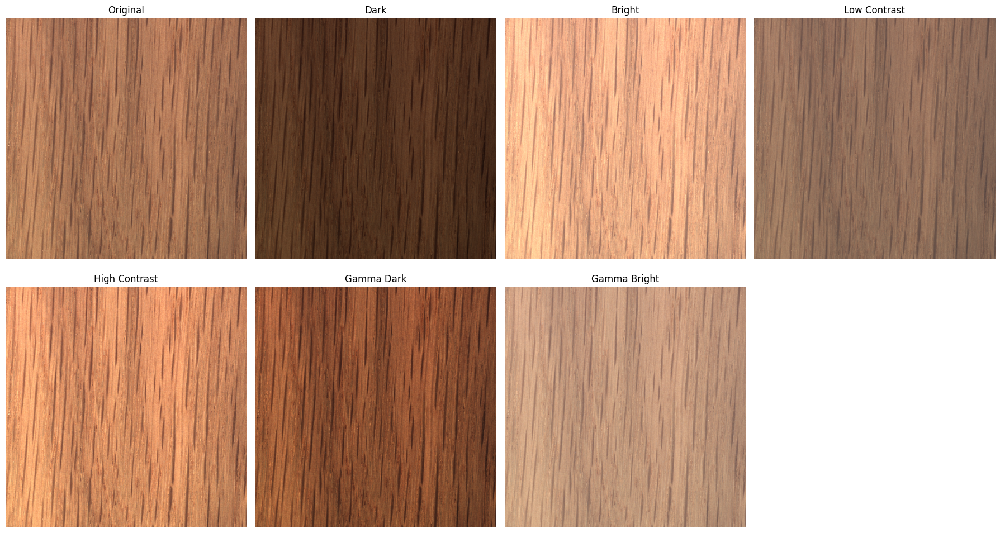

Category: wood
Image: /kaggle/input/datasets/ipythonx/mvtec-ad/wood/train/good/127.png


In [ ]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import random
import numpy as np

# Find MVTec path
mvtec_root = Path("/kaggle/input/datasets/ipythonx/mvtec-ad")

# Get some good training images
images = list(mvtec_root.rglob("train/good/*.png"))

print("Images found:", len(images))

# Random image
img_path = random.choice(images)

img = cv2.imread(str(img_path))
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# ---------------------------
# Lighting Augmentations
# ---------------------------

# Dark
dark = cv2.convertScaleAbs(img, alpha=0.60, beta=-20)

# Bright
bright = cv2.convertScaleAbs(img, alpha=1.25, beta=30)

# Low contrast
low_contrast = cv2.convertScaleAbs(img, alpha=0.65, beta=35)

# High contrast
high_contrast = cv2.convertScaleAbs(img, alpha=1.40, beta=-20)

# Gamma dark
gamma = 1.5
gamma_dark = np.power(img / 255.0, gamma)
gamma_dark = np.uint8(gamma_dark * 255)

# Gamma bright
gamma = 0.65
gamma_bright = np.power(img / 255.0, gamma)
gamma_bright = np.uint8(gamma_bright * 255)

versions = [
    ("Original", img),
    ("Dark", dark),
    ("Bright", bright),
    ("Low Contrast", low_contrast),
    ("High Contrast", high_contrast),
    ("Gamma Dark", gamma_dark),
    ("Gamma Bright", gamma_bright),
]

plt.figure(figsize=(18, 10))

for i, (title, image) in enumerate(versions):
    plt.subplot(2, 4, i + 1)
    plt.imshow(image)
    plt.title(title)
    plt.axis("off")

plt.tight_layout()
plt.show()

print("Category:", img_path.parts[-4])
print("Image:", img_path)

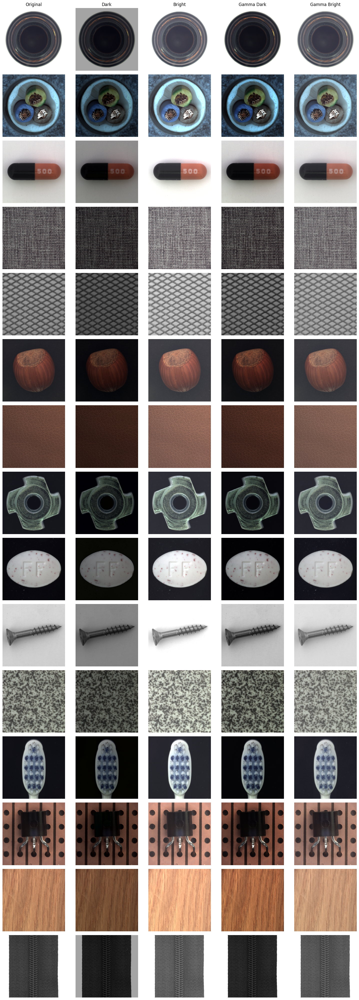

In [ ]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np
import random

mvtec_root = Path("/kaggle/input/datasets/ipythonx/mvtec-ad")

categories = [
    "bottle", "cable", "capsule", "carpet", "grid",
    "hazelnut", "leather", "metal_nut", "pill", "screw",
    "tile", "toothbrush", "transistor", "wood", "zipper"
]

def lighting_versions(img):
    dark = cv2.convertScaleAbs(img, alpha=0.70, beta=-15)
    bright = cv2.convertScaleAbs(img, alpha=1.20, beta=20)

    gamma_dark = np.uint8(
        np.power(img / 255.0, 1.35) * 255
    )

    gamma_bright = np.uint8(
        np.power(img / 255.0, 0.75) * 255
    )

    return [img, dark, bright, gamma_dark, gamma_bright]


titles = [
    "Original",
    "Dark",
    "Bright",
    "Gamma Dark",
    "Gamma Bright"
]

fig, axes = plt.subplots(
    len(categories),
    5,
    figsize=(15, 40)
)

for row, category in enumerate(categories):

    paths = list(
        (mvtec_root / category / "train" / "good").glob("*.png")
    )

    img_path = random.choice(paths)

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    versions = lighting_versions(img)

    for col, version in enumerate(versions):

        axes[row, col].imshow(version)
        axes[row, col].axis("off")

        if row == 0:
            axes[row, col].set_title(titles[col])

        if col == 0:
            axes[row, col].set_ylabel(
                category,
                fontsize=11,
                rotation=0,
                labelpad=45
            )

plt.tight_layout()
plt.show()

In [ ]:
import torch
from pathlib import Path
from ultralytics import YOLO

DATA_YAML = "/kaggle/working/mvtec_yolo_seg_15cat/data.yaml"

# V1 saved model
V1_PATH = str(list(
    Path("/kaggle/input").rglob("best.pt")
)[0])

print("=" * 60)
print("V4 PRE-FLIGHT CHECK")
print("=" * 60)

print("V1 Model :", V1_PATH)
print("Data YAML:", DATA_YAML)

print("\nGPU available:", torch.cuda.is_available())
print("GPU count    :", torch.cuda.device_count())

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}:", torch.cuda.get_device_name(i))

assert Path(V1_PATH).exists(), "❌ V1 best.pt missing"
assert Path(DATA_YAML).exists(), "❌ data.yaml missing"

model_v4 = YOLO(V1_PATH)

print("\nModel classes:", model_v4.names)

assert model_v4.names == {0: "defect"}, "❌ Wrong model"

print("\n✅ EVERYTHING READY FOR V4")

V4 PRE-FLIGHT CHECK
V1 Model : /kaggle/input/datasets/ahmedabdelrahi/industrial-defect-model/best.pt
Data YAML: /kaggle/working/mvtec_yolo_seg_15cat/data.yaml

GPU available: True
GPU count    : 2
GPU 0: Tesla T4
GPU 1: Tesla T4

Model classes: {0: 'defect'}

✅ EVERYTHING READY FOR V4


In [ ]:
from ultralytics import YOLO

# Reload V1 weights cleanly
model_v4 = YOLO(V1_PATH)

results_v4 = model_v4.train(
    data=DATA_YAML,

    # -------------------------
    # Training
    # -------------------------
    epochs=30,
    imgsz=640,
    batch=16,
    device=[0, 1],

    optimizer="AdamW",
    lr0=0.0001,
    lrf=0.01,
    weight_decay=0.0005,

    patience=10,

    # -------------------------
    # Lighting / Color Augmentation
    # -------------------------
    hsv_h=0.025,
    hsv_s=0.45,
    hsv_v=0.45,

    # -------------------------
    # Mild geometric augmentation
    # -------------------------
    degrees=5.0,
    translate=0.08,
    scale=0.20,
    shear=2.0,

    fliplr=0.5,
    flipud=0.0,

    # Keep mosaic mild
    mosaic=0.25,
    mixup=0.0,
    close_mosaic=5,

    # -------------------------
    # Output
    # -------------------------
    project="/kaggle/working/runs",
    name="industrial_defect_15cat_V4_lighting",
    exist_ok=True,

    seed=42,
    deterministic=True,

    plots=True,
    save=True,
    verbose=True
)

Ultralytics 8.4.152 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
                                                        CUDA:1 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=5, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/mvtec_yolo_seg_15cat/data.yaml, degrees=5.0, deterministic=True, device=0,1, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.025, hsv_s=0.45, hsv_v=0.45, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/ka

/usr/local/lib/python3.12/dist-packages/ultralytics/utils/loss.py:628: UserWarning: Specified kernel cache directory could not be created! This disables kernel caching. Specified directory is /root/.cache/torch/kernels. This warning will appear only once per process. (Triggered internally at /pytorch/aten/src/ATen/native/cuda/jit_utils.cpp:1487.)
  marea = xyxy2xywh(target_bboxes_normalized)[..., 2:].prod(2)



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
       1/30       2.3G      1.095      1.907      0.845      1.183          0          5        640: 100% ━━━━━━━━━━━━ 110/110 3.1it/s 35.1s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 1.9it/s 6.2s0.4s
                   all        378        292      0.828       0.62      0.702      0.424      0.757      0.682      0.732      0.375


/usr/local/lib/python3.12/dist-packages/ray/train/_internal/session.py:676: UserWarning: `get_trial_id` is meant to only be called inside a function that is executed by a Tuner or Trainer. Returning `None`.
  warnings.warn(



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
       2/30      2.69G     0.9824      1.693     0.7238      1.112          0          4        640: 100% ━━━━━━━━━━━━ 110/110 3.4it/s 32.5s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 2.0it/s 6.1s0.3s
                   all        378        292      0.777      0.719      0.755       0.45      0.802      0.699      0.767        0.4

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
       3/30      2.69G     0.9473      1.631     0.7055      1.084          0          3        640: 100% ━━━━━━━━━━━━ 110/110 3.4it/s 32.7s0.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 12/12 2.2it/s 5.4s0.4s
                   all   

In [ ]:
from ultralytics import YOLO
from pathlib import Path
import numpy as np
import gc

# ============================================================
# V4 VALIDATION CALIBRATION — CPU SAFE VERSION
# ============================================================

V4_PATH = "/kaggle/working/runs/industrial_defect_15cat_V4_lighting/weights/best.pt"

VAL_DIR = Path("/kaggle/working/mvtec_yolo_seg_15cat/images/val")
VAL_LABEL_DIR = Path("/kaggle/working/mvtec_yolo_seg_15cat/labels/val")

gc.collect()

# Load V4
model = YOLO(V4_PATH)

# Images
val_images = sorted(
    list(VAL_DIR.glob("*.png")) +
    list(VAL_DIR.glob("*.jpg")) +
    list(VAL_DIR.glob("*.jpeg"))
)

# Ground truth
y_true = []

for img_path in val_images:

    label_path = VAL_LABEL_DIR / f"{img_path.stem}.txt"

    defective = (
        label_path.exists()
        and label_path.stat().st_size > 0
    )

    y_true.append(int(defective))

y_true = np.array(y_true)

print("Validation images:", len(val_images))
print("Defective:", int(y_true.sum()))
print("Good:", int(len(y_true) - y_true.sum()))

# ============================================================
# ONE IMAGE AT A TIME — CPU
# ============================================================

max_conf = []

for i, img_path in enumerate(val_images, 1):

    result = model.predict(
        source=str(img_path),
        imgsz=640,
        conf=0.001,
        iou=0.7,
        device="cpu",       # IMPORTANT
        verbose=False
    )[0]

    if result.boxes is not None and len(result.boxes) > 0:
        confidence = float(result.boxes.conf.max())
    else:
        confidence = 0.0

    max_conf.append(confidence)

    del result

    if i % 25 == 0 or i == len(val_images):
        print(f"Processed {i}/{len(val_images)}")

max_conf = np.array(max_conf)

print("\n✅ All validation images processed")

# ============================================================
# THRESHOLD SWEEP
# ============================================================

thresholds = np.arange(0.005, 0.201, 0.005)

rows = []

for t in thresholds:

    y_pred = (max_conf >= t).astype(int)

    TP = int(((y_true == 1) & (y_pred == 1)).sum())
    TN = int(((y_true == 0) & (y_pred == 0)).sum())
    FP = int(((y_true == 0) & (y_pred == 1)).sum())
    FN = int(((y_true == 1) & (y_pred == 0)).sum())

    accuracy = (TP + TN) / len(y_true)

    precision = TP / (TP + FP) if TP + FP else 0
    recall = TP / (TP + FN) if TP + FN else 0
    specificity = TN / (TN + FP) if TN + FP else 0

    f1 = (
        2 * precision * recall / (precision + recall)
        if precision + recall else 0
    )

    rows.append({
        "threshold": float(t),
        "TP": TP,
        "TN": TN,
        "FP": FP,
        "FN": FN,
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "specificity": specificity,
        "f1": f1
    })

# ============================================================
# SAME RULE AS V1:
# Recall >= 95%, then highest F1
# ============================================================

eligible = [r for r in rows if r["recall"] >= 0.95]

if eligible:

    best = max(
        eligible,
        key=lambda r: (r["f1"], r["specificity"])
    )

    print("\n" + "=" * 65)
    print("BEST V4 THRESHOLD — RECALL >= 95%")
    print("=" * 65)

    print(f"Threshold   : {best['threshold']:.3f}")
    print(f"TP          : {best['TP']}")
    print(f"TN          : {best['TN']}")
    print(f"FP          : {best['FP']}")
    print(f"FN          : {best['FN']}")

    print(f"Accuracy    : {best['accuracy']*100:.2f}%")
    print(f"Precision   : {best['precision']*100:.2f}%")
    print(f"Recall      : {best['recall']*100:.2f}%")
    print(f"Specificity : {best['specificity']*100:.2f}%")
    print(f"F1          : {best['f1']*100:.2f}%")

else:
    print("❌ No threshold achieved Recall >= 95%")

Validation images: 378
Defective: 189
Good: 189
Processed 25/378
Processed 50/378
Processed 75/378
Processed 100/378
Processed 125/378
Processed 150/378
Processed 175/378
Processed 200/378
Processed 225/378
Processed 250/378
Processed 275/378
Processed 300/378
Processed 325/378
Processed 350/378
Processed 375/378
Processed 378/378

✅ All validation images processed

BEST V4 THRESHOLD — RECALL >= 95%
Threshold   : 0.090
TP          : 180
TN          : 181
FP          : 8
FN          : 9
Accuracy    : 95.50%
Precision   : 95.74%
Recall      : 95.24%
Specificity : 95.77%
F1          : 95.49%


In [ ]:
from ultralytics import YOLO
from pathlib import Path
import numpy as np
import gc

# ============================================================
# V4 LOCKED TEST — threshold calibrated ONLY on validation
# ============================================================

V4_PATH = "/kaggle/working/runs/industrial_defect_15cat_V4_lighting/weights/best.pt"

TEST_DIR = Path("/kaggle/working/mvtec_yolo_seg_15cat/images/test")
TEST_LABEL_DIR = Path("/kaggle/working/mvtec_yolo_seg_15cat/labels/test")

LOCKED_THRESHOLD = 0.090

gc.collect()

model = YOLO(V4_PATH)

test_images = sorted(
    list(TEST_DIR.glob("*.png")) +
    list(TEST_DIR.glob("*.jpg")) +
    list(TEST_DIR.glob("*.jpeg"))
)

# ============================================================
# Ground Truth
# ============================================================

y_true = []

for img_path in test_images:

    label_path = TEST_LABEL_DIR / f"{img_path.stem}.txt"

    defective = (
        label_path.exists()
        and label_path.stat().st_size > 0
    )

    y_true.append(int(defective))

y_true = np.array(y_true)

print("=" * 65)
print("V4 LOCKED TEST")
print("=" * 65)

print("Threshold :", LOCKED_THRESHOLD)
print("Images    :", len(test_images))
print("Defective :", int(y_true.sum()))
print("Good      :", int(len(y_true) - y_true.sum()))

# ============================================================
# Inference — CPU
# ============================================================

max_conf = []

for i, img_path in enumerate(test_images, 1):

    result = model.predict(
        source=str(img_path),
        imgsz=640,
        conf=0.001,
        iou=0.7,
        device="cpu",
        verbose=False
    )[0]

    if result.boxes is not None and len(result.boxes) > 0:
        confidence = float(result.boxes.conf.max())
    else:
        confidence = 0.0

    max_conf.append(confidence)

    del result

    if i % 25 == 0 or i == len(test_images):
        print(f"Processed {i}/{len(test_images)}")

max_conf = np.array(max_conf)

# ============================================================
# LOCKED threshold — NO tuning on test
# ============================================================

y_pred = (max_conf >= LOCKED_THRESHOLD).astype(int)

TP = int(((y_true == 1) & (y_pred == 1)).sum())
TN = int(((y_true == 0) & (y_pred == 0)).sum())
FP = int(((y_true == 0) & (y_pred == 1)).sum())
FN = int(((y_true == 1) & (y_pred == 0)).sum())

accuracy = (TP + TN) / len(y_true)
precision = TP / (TP + FP) if (TP + FP) else 0
recall = TP / (TP + FN) if (TP + FN) else 0
specificity = TN / (TN + FP) if (TN + FP) else 0

f1 = (
    2 * precision * recall / (precision + recall)
    if (precision + recall)
    else 0
)

print("\n" + "=" * 65)
print("V4 FINAL LOCKED TEST RESULTS")
print("=" * 65)

print(f"Threshold   : {LOCKED_THRESHOLD:.3f}")
print(f"TP          : {TP}")
print(f"TN          : {TN}")
print(f"FP          : {FP}")
print(f"FN          : {FN}")

print(f"\nAccuracy    : {accuracy*100:.2f}%")
print(f"Precision   : {precision*100:.2f}%")
print(f"Recall      : {recall*100:.2f}%")
print(f"Specificity : {specificity*100:.2f}%")
print(f"F1          : {f1*100:.2f}%")

V4 LOCKED TEST
Threshold : 0.09
Images    : 378
Defective : 189
Good      : 189
Processed 25/378
Processed 50/378
Processed 75/378
Processed 100/378
Processed 125/378
Processed 150/378
Processed 175/378
Processed 200/378
Processed 225/378
Processed 250/378
Processed 275/378
Processed 300/378
Processed 325/378
Processed 350/378
Processed 375/378
Processed 378/378

V4 FINAL LOCKED TEST RESULTS
Threshold   : 0.090
TP          : 182
TN          : 179
FP          : 10
FN          : 7

Accuracy    : 95.50%
Precision   : 94.79%
Recall      : 96.30%
Specificity : 94.71%
F1          : 95.54%


V4 EXTERNAL HAZELNUT TEST
Known Ground Truth : GOOD / NORMAL
Threshold          : 0.090
Defect Regions     : 0
Max Confidence     : 0.00%
Prediction         : GOOD ✅
External Result    : CORRECT ✅


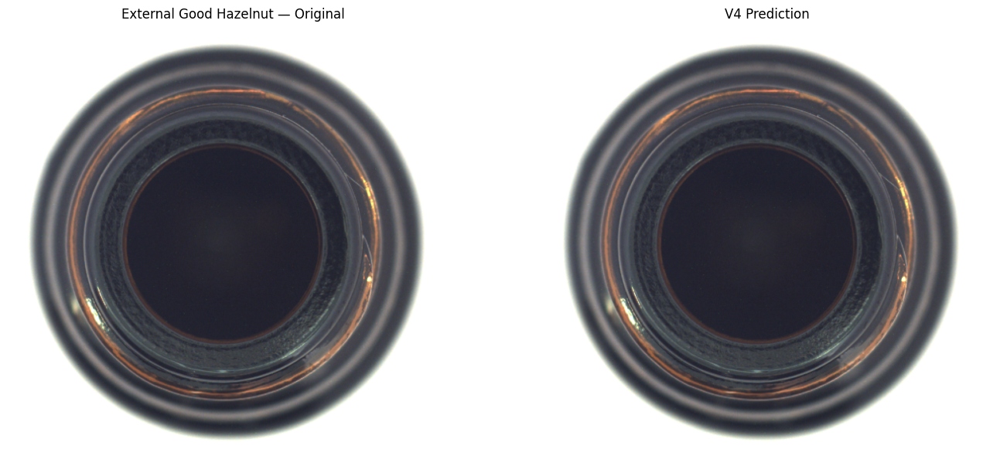

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import numpy as np

# =========================
# V4 External Hazelnut Test
# =========================

V4_PATH = "/kaggle/working/runs/industrial_defect_15cat_V4_lighting/weights/best.pt"
V4_CONF = 0.090

model_v4 = YOLO(V4_PATH)

result = model_v4.predict(
    source=EXTERNAL_IMAGE_2,
    imgsz=640,
    conf=V4_CONF,
    iou=0.7,
    device="cpu",
    retina_masks=True,
    verbose=False
)[0]

# Number of predicted defect regions
num_regions = len(result.boxes) if result.boxes is not None else 0

# Confidence
if num_regions > 0:
    confidences = result.boxes.conf.cpu().numpy()
    max_conf = float(confidences.max())
else:
    confidences = np.array([])
    max_conf = 0.0

# =========================
# Results
# =========================

print("=" * 65)
print("V4 EXTERNAL HAZELNUT TEST")
print("=" * 65)

print("Known Ground Truth : GOOD / NORMAL")
print(f"Threshold          : {V4_CONF:.3f}")
print(f"Defect Regions     : {num_regions}")
print(f"Max Confidence     : {max_conf * 100:.2f}%")

if num_regions == 0:
    print("Prediction         : GOOD ✅")
    print("External Result    : CORRECT ✅")
else:
    print("Prediction         : DEFECTIVE ❌")
    print("External Result    : FALSE POSITIVE ❌")

# Show all confidences if defects exist
if num_regions > 0:
    print("\nDetected confidences:")
    for i, conf in enumerate(confidences, 1):
        print(f"Region {i}: {conf * 100:.2f}%")

# =========================
# Visualization
# =========================

original = cv2.imread(EXTERNAL_IMAGE_2)
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

prediction = result.plot()
prediction = cv2.cvtColor(prediction, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(original)
plt.title("External Good Hazelnut — Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(prediction)
plt.title("V4 Prediction")
plt.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
import shutil

V4_PATH = "/kaggle/working/runs/industrial_defect_15cat_V4_lighting/weights/best.pt"
SAVE_PATH = "/kaggle/working/VisionGuard_V4_best.pt"

shutil.copy2(V4_PATH, SAVE_PATH)

print("✅ FINAL MODEL SAVED")
print(SAVE_PATH)

✅ FINAL MODEL SAVED
/kaggle/working/VisionGuard_V4_best.pt


In [ ]:
from pathlib import Path
from collections import defaultdict

MVTEC_PATH = Path("/kaggle/input/datasets/ipythonx/mvtec-ad")

PRODUCT_CLASSES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper",
]

print("=" * 65)
print("VISIONGUARD PRODUCT CLASSIFIER — DATA CHECK")
print("=" * 65)

total = 0
class_counts = {}

for category in PRODUCT_CLASSES:
    category_path = MVTEC_PATH / category

    images = []

    # train images
    train_path = category_path / "train"
    if train_path.exists():
        images.extend(train_path.rglob("*.png"))

    # test images: good + defective
    test_path = category_path / "test"
    if test_path.exists():
        images.extend(test_path.rglob("*.png"))

    images = list(images)

    class_counts[category] = len(images)
    total += len(images)

    print(f"{category:<15} : {len(images):>5} images")

print("-" * 65)
print(f"{'TOTAL':<15} : {total:>5} images")
print(f"{'CLASSES':<15} : {len(PRODUCT_CLASSES):>5}")
print("=" * 65)

missing = [
    category
    for category, count in class_counts.items()
    if count == 0
]

if missing:
    print("❌ Missing categories:", missing)
else:
    print("✅ All 15 product categories found.")

VISIONGUARD PRODUCT CLASSIFIER — DATA CHECK
bottle          :   292 images
cable           :   374 images
capsule         :   351 images
carpet          :   397 images
grid            :   342 images
hazelnut        :   501 images
leather         :   369 images
metal_nut       :   335 images
pill            :   434 images
screw           :   480 images
tile            :   347 images
toothbrush      :   102 images
transistor      :   313 images
wood            :   326 images
zipper          :   391 images
-----------------------------------------------------------------
TOTAL           :  5354 images
CLASSES         :    15
✅ All 15 product categories found.


In [ ]:
from pathlib import Path
import shutil
import random
from collections import defaultdict

# ============================================================
# VISIONGUARD PRODUCT CLASSIFIER
# BUILD 15-CLASS DATASET
# ============================================================

SEED = 42
random.seed(SEED)

MVTEC_PATH = Path("/kaggle/input/datasets/ipythonx/mvtec-ad")
CLASSIFIER_PATH = Path("/kaggle/working/visionguard_product_classifier")

PRODUCT_CLASSES = [
    "bottle",
    "cable",
    "capsule",
    "carpet",
    "grid",
    "hazelnut",
    "leather",
    "metal_nut",
    "pill",
    "screw",
    "tile",
    "toothbrush",
    "transistor",
    "wood",
    "zipper",
]

# Start clean
if CLASSIFIER_PATH.exists():
    shutil.rmtree(CLASSIFIER_PATH)

for split in ["train", "val", "test"]:
    for category in PRODUCT_CLASSES:
        (CLASSIFIER_PATH / split / category).mkdir(
            parents=True,
            exist_ok=True
        )

split_stats = defaultdict(dict)

print("=" * 75)
print("VISIONGUARD — BUILDING PRODUCT CLASSIFICATION DATASET")
print("=" * 75)

for category in PRODUCT_CLASSES:

    category_path = MVTEC_PATH / category

    images = []

    # --------------------------------------------------------
    # Collect TRAIN images
    # --------------------------------------------------------
    train_path = category_path / "train"

    if train_path.exists():
        images.extend(list(train_path.rglob("*.png")))

    # --------------------------------------------------------
    # Collect TEST images
    # good + defective
    # --------------------------------------------------------
    test_path = category_path / "test"

    if test_path.exists():
        images.extend(list(test_path.rglob("*.png")))

    images = sorted(images)

    # Shuffle reproducibly
    random.Random(SEED).shuffle(images)

    n = len(images)

    # --------------------------------------------------------
    # 70 / 15 / 15 split
    # --------------------------------------------------------
    n_train = int(n * 0.70)
    n_val = int(n * 0.15)

    train_images = images[:n_train]
    val_images = images[n_train:n_train + n_val]
    test_images = images[n_train + n_val:]

    splits = {
        "train": train_images,
        "val": val_images,
        "test": test_images,
    }

    # --------------------------------------------------------
    # Copy images
    # --------------------------------------------------------
    for split_name, split_images in splits.items():

        output_dir = CLASSIFIER_PATH / split_name / category

        for i, src in enumerate(split_images):

            # Unique name because train/test may contain same filenames
            new_name = (
                f"{category}_{i:04d}_"
                f"{src.parent.name}_{src.name}"
            )

            dst = output_dir / new_name

            shutil.copy2(src, dst)

        split_stats[category][split_name] = len(split_images)

    print(
        f"{category:<15} | "
        f"Train: {len(train_images):>3} | "
        f"Val: {len(val_images):>3} | "
        f"Test: {len(test_images):>3} | "
        f"Total: {n:>3}"
    )


# ============================================================
# FINAL VALIDATION
# ============================================================

print("\n" + "=" * 75)
print("FINAL DATASET SUMMARY")
print("=" * 75)

grand_train = 0
grand_val = 0
grand_test = 0

for category in PRODUCT_CLASSES:

    train_count = len(
        list((CLASSIFIER_PATH / "train" / category).glob("*"))
    )

    val_count = len(
        list((CLASSIFIER_PATH / "val" / category).glob("*"))
    )

    test_count = len(
        list((CLASSIFIER_PATH / "test" / category).glob("*"))
    )

    grand_train += train_count
    grand_val += val_count
    grand_test += test_count

    print(
        f"{category:<15} | "
        f"{train_count:>3} | "
        f"{val_count:>3} | "
        f"{test_count:>3}"
    )


print("-" * 75)

print(f"TRAIN : {grand_train}")
print(f"VAL   : {grand_val}")
print(f"TEST  : {grand_test}")
print(f"TOTAL : {grand_train + grand_val + grand_test}")

print("-" * 75)

print("Dataset path:")
print(CLASSIFIER_PATH)

print("=" * 75)


# ============================================================
# SAFETY CHECKS
# ============================================================

assert grand_train + grand_val + grand_test == 5354

for category in PRODUCT_CLASSES:

    assert split_stats[category]["train"] > 0
    assert split_stats[category]["val"] > 0
    assert split_stats[category]["test"] > 0

print("✅ ALL CHECKS PASSED")
print("✅ 15 PRODUCT CLASSES READY FOR TRAINING")

VISIONGUARD — BUILDING PRODUCT CLASSIFICATION DATASET
bottle          | Train: 204 | Val:  43 | Test:  45 | Total: 292
cable           | Train: 261 | Val:  56 | Test:  57 | Total: 374
capsule         | Train: 245 | Val:  52 | Test:  54 | Total: 351
carpet          | Train: 277 | Val:  59 | Test:  61 | Total: 397
grid            | Train: 239 | Val:  51 | Test:  52 | Total: 342
hazelnut        | Train: 350 | Val:  75 | Test:  76 | Total: 501
leather         | Train: 258 | Val:  55 | Test:  56 | Total: 369
metal_nut       | Train: 234 | Val:  50 | Test:  51 | Total: 335
pill            | Train: 303 | Val:  65 | Test:  66 | Total: 434
screw           | Train: 336 | Val:  72 | Test:  72 | Total: 480
tile            | Train: 242 | Val:  52 | Test:  53 | Total: 347
toothbrush      | Train:  71 | Val:  15 | Test:  16 | Total: 102
transistor      | Train: 219 | Val:  46 | Test:  48 | Total: 313
wood            | Train: 228 | Val:  48 | Test:  50 | Total: 326
zipper          | Train: 273 | Val: 

In [ ]:
import torch

print("CUDA Available:", torch.cuda.is_available())
print("GPU Count:", torch.cuda.device_count())

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)}")

CUDA Available: True
GPU Count: 2
GPU 0: Tesla T4
GPU 1: Tesla T4


In [ ]:
# ============================================================
# VISIONGUARD PRODUCT CLASSIFIER
# TRAIN 15-CLASS PRODUCT RECOGNITION MODEL
# ============================================================

from ultralytics import YOLO
import torch
from pathlib import Path

# ------------------------------------------------------------
# Paths
# ------------------------------------------------------------

CLASSIFIER_DATA = Path(
    "/kaggle/working/visionguard_product_classifier"
)

RUNS_PATH = "/kaggle/working/runs"

RUN_NAME = "VisionGuard_ProductClassifier_15Class"

# ------------------------------------------------------------
# GPU Check
# ------------------------------------------------------------

print("=" * 70)
print("VISIONGUARD PRODUCT CLASSIFIER")
print("=" * 70)

print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU count:", torch.cuda.device_count())

    for i in range(torch.cuda.device_count()):
        print(
            f"GPU {i}:",
            torch.cuda.get_device_name(i)
        )

print("-" * 70)

print("Dataset:")
print(CLASSIFIER_DATA)

print("-" * 70)

# ------------------------------------------------------------
# Load pretrained classification model
# ------------------------------------------------------------

model = YOLO("yolo11s-cls.pt")

print("Base model loaded: YOLO11s-cls")
print("Target classes: 15")

print("=" * 70)

# ------------------------------------------------------------
# Training
# ------------------------------------------------------------

results = model.train(

    data=str(CLASSIFIER_DATA),

    # Training
    epochs=50,
    imgsz=224,
    batch=64,

    # GPU
    device=0,

    # Optimizer
    optimizer="AdamW",
    lr0=0.0005,
    lrf=0.01,
    weight_decay=0.0005,

    # Early stopping
    patience=10,

    # --------------------------------------------------------
    # Augmentation
    # Important for product recognition + class imbalance
    # --------------------------------------------------------

    hsv_h=0.015,
    hsv_s=0.30,
    hsv_v=0.30,

    degrees=5.0,
    translate=0.05,
    scale=0.15,

    fliplr=0.5,
    flipud=0.0,

    # --------------------------------------------------------
    # Reproducibility
    # --------------------------------------------------------

    seed=42,
    deterministic=True,

    # --------------------------------------------------------
    # Output
    # --------------------------------------------------------

    project=RUNS_PATH,
    name=RUN_NAME,
    exist_ok=True,

    save=True,
    plots=True,
    verbose=True
)

# ------------------------------------------------------------
# Best model
# ------------------------------------------------------------

BEST_MODEL = (
    Path(RUNS_PATH)
    / RUN_NAME
    / "weights"
    / "best.pt"
)

print()
print("=" * 70)
print("TRAINING FINISHED")
print("=" * 70)

print("Best model:")
print(BEST_MODEL)

print("Exists:", BEST_MODEL.exists())

print("=" * 70)

VISIONGUARD PRODUCT CLASSIFIER
PyTorch: 2.10.0+cu128
CUDA available: True
GPU count: 2
GPU 0: Tesla T4
GPU 1: Tesla T4
----------------------------------------------------------------------
Dataset:
/kaggle/working/visionguard_product_classifier
----------------------------------------------------------------------
Base model loaded: YOLO11s-cls
Target classes: 15
Ultralytics 8.4.152 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14912MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=64, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/visionguard_product_classifier, degrees=5.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs

VISIONGUARD PRODUCT CLASSIFIER — FINAL LOCKED TEST
Model: /kaggle/working/runs/VisionGuard_ProductClassifier_15Class/weights/best.pt
Test : /kaggle/working/visionguard_product_classifier/test

Model classes:
 0 -> bottle
 1 -> cable
 2 -> capsule
 3 -> carpet
 4 -> grid
 5 -> hazelnut
 6 -> leather
 7 -> metal_nut
 8 -> pill
 9 -> screw
10 -> tile
11 -> toothbrush
12 -> transistor
13 -> wood
14 -> zipper

Test images: 817

Running GPU inference...

Processed 100/817
Processed 200/817
Processed 300/817
Processed 400/817
Processed 500/817
Processed 600/817
Processed 700/817
Processed 800/817
Processed 817/817

FINAL PRODUCT CLASSIFIER TEST RESULTS
Images             : 817
Correct            : 817
Incorrect          : 0
---------------------------------------------------------------------------
Accuracy           : 100.00%
Macro Precision    : 100.00%
Macro Recall       : 100.00%
Macro F1           : 100.00%
---------------------------------------------------------------------------
Weigh

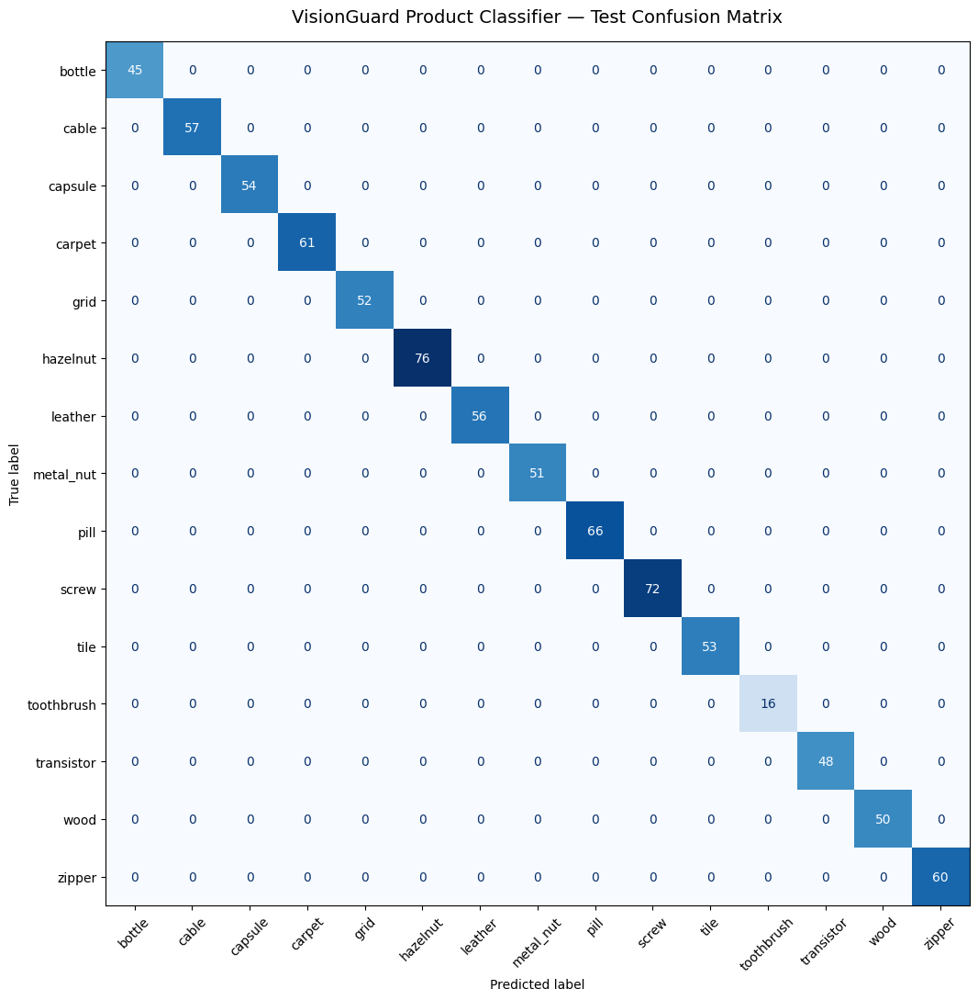


MISCLASSIFIED IMAGES
✅ No misclassified test images.


In [ ]:
# ============================================================
# VISIONGUARD PRODUCT CLASSIFIER
# FINAL TEST — 817 UNSEEN TEST IMAGES
# Accuracy + Macro F1 + Per-Class Metrics + Confusion Matrix
# ============================================================

from ultralytics import YOLO
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import (
    accuracy_score,
    precision_recall_fscore_support,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

# ============================================================
# PATHS
# ============================================================

BEST_MODEL = Path(
    "/kaggle/working/runs/"
    "VisionGuard_ProductClassifier_15Class/"
    "weights/best.pt"
)

TEST_DIR = Path(
    "/kaggle/working/visionguard_product_classifier/test"
)

print("=" * 75)
print("VISIONGUARD PRODUCT CLASSIFIER — FINAL LOCKED TEST")
print("=" * 75)

print("Model:", BEST_MODEL)
print("Test :", TEST_DIR)

assert BEST_MODEL.exists(), "❌ best.pt not found"
assert TEST_DIR.exists(), "❌ Test directory not found"

# ============================================================
# LOAD MODEL
# ============================================================

model = YOLO(str(BEST_MODEL))

print("\nModel classes:")

for class_id, class_name in model.names.items():
    print(f"{class_id:>2} -> {class_name}")

# ============================================================
# BUILD TEST LIST
# ============================================================

image_extensions = {
    ".png",
    ".jpg",
    ".jpeg",
    ".bmp",
    ".webp"
}

test_images = []
y_true = []

for class_name in sorted(model.names.values()):

    class_dir = TEST_DIR / class_name

    images = sorted([
        p for p in class_dir.rglob("*")
        if p.suffix.lower() in image_extensions
    ])

    for image_path in images:
        test_images.append(image_path)
        y_true.append(class_name)

print("\nTest images:", len(test_images))

assert len(test_images) == 817, (
    f"Expected 817 test images, found {len(test_images)}"
)

# ============================================================
# INFERENCE
# ============================================================

y_pred = []
confidences = []

print("\nRunning GPU inference...\n")

for i, image_path in enumerate(test_images, start=1):

    result = model.predict(
        source=str(image_path),
        imgsz=224,
        device=0,
        verbose=False
    )[0]

    probs = result.probs

    predicted_id = int(probs.top1)
    confidence = float(probs.top1conf.cpu().item())

    predicted_class = model.names[predicted_id]

    y_pred.append(predicted_class)
    confidences.append(confidence)

    if i % 100 == 0 or i == len(test_images):
        print(f"Processed {i}/{len(test_images)}")

# ============================================================
# METRICS
# ============================================================

accuracy = accuracy_score(y_true, y_pred)

macro_precision, macro_recall, macro_f1, _ = (
    precision_recall_fscore_support(
        y_true,
        y_pred,
        average="macro",
        zero_division=0
    )
)

weighted_precision, weighted_recall, weighted_f1, _ = (
    precision_recall_fscore_support(
        y_true,
        y_pred,
        average="weighted",
        zero_division=0
    )
)

correct = np.array(y_true) == np.array(y_pred)

print("\n" + "=" * 75)
print("FINAL PRODUCT CLASSIFIER TEST RESULTS")
print("=" * 75)

print(f"Images             : {len(y_true)}")
print(f"Correct            : {int(correct.sum())}")
print(f"Incorrect          : {int((~correct).sum())}")

print("-" * 75)

print(f"Accuracy           : {accuracy * 100:.2f}%")
print(f"Macro Precision    : {macro_precision * 100:.2f}%")
print(f"Macro Recall       : {macro_recall * 100:.2f}%")
print(f"Macro F1           : {macro_f1 * 100:.2f}%")

print("-" * 75)

print(f"Weighted Precision : {weighted_precision * 100:.2f}%")
print(f"Weighted Recall    : {weighted_recall * 100:.2f}%")
print(f"Weighted F1        : {weighted_f1 * 100:.2f}%")

print("-" * 75)

print(
    f"Mean Confidence    : "
    f"{np.mean(confidences) * 100:.2f}%"
)

print("=" * 75)

# ============================================================
# PER-CLASS REPORT
# ============================================================

CLASS_NAMES = sorted(model.names.values())

print("\nPER-CLASS CLASSIFICATION REPORT\n")

print(
    classification_report(
        y_true,
        y_pred,
        labels=CLASS_NAMES,
        target_names=CLASS_NAMES,
        digits=4,
        zero_division=0
    )
)

# ============================================================
# CONFUSION MATRIX
# ============================================================

cm = confusion_matrix(
    y_true,
    y_pred,
    labels=CLASS_NAMES
)

fig, ax = plt.subplots(figsize=(13, 11))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=CLASS_NAMES
)

disp.plot(
    ax=ax,
    cmap="Blues",
    xticks_rotation=45,
    colorbar=False,
    values_format="d"
)

plt.title(
    "VisionGuard Product Classifier — Test Confusion Matrix",
    fontsize=14,
    pad=15
)

plt.tight_layout()
plt.show()

# ============================================================
# SHOW WRONG PREDICTIONS
# ============================================================

wrong_indices = np.where(~correct)[0]

print("\n" + "=" * 75)
print("MISCLASSIFIED IMAGES")
print("=" * 75)

if len(wrong_indices) == 0:

    print("✅ No misclassified test images.")

else:

    print(f"Total mistakes: {len(wrong_indices)}\n")

    for idx in wrong_indices[:30]:

        print(
            f"TRUE: {y_true[idx]:<15} | "
            f"PRED: {y_pred[idx]:<15} | "
            f"CONF: {confidences[idx] * 100:6.2f}% | "
            f"{test_images[idx].name}"
        )

print("=" * 75)

In [ ]:
# ============================================================
# SAVE FINAL PRODUCT CLASSIFIER
# ============================================================

import shutil
from pathlib import Path

CLASSIFIER_BEST = Path(
    "/kaggle/working/runs/"
    "VisionGuard_ProductClassifier_15Class/"
    "weights/best.pt"
)

SAVE_PATH = Path(
    "/kaggle/working/VisionGuard_ProductClassifier_best.pt"
)

assert CLASSIFIER_BEST.exists(), "❌ Classifier best.pt not found"

shutil.copy2(CLASSIFIER_BEST, SAVE_PATH)

print("=" * 65)
print("VISIONGUARD PRODUCT CLASSIFIER SAVED")
print("=" * 65)
print("Source :", CLASSIFIER_BEST)
print("Saved  :", SAVE_PATH)
print("Exists :", SAVE_PATH.exists())
print(f"Size   : {SAVE_PATH.stat().st_size / (1024**2):.2f} MB")
print("=" * 65)
print("✅ FINAL 15-CLASS PRODUCT CLASSIFIER READY")

VISIONGUARD PRODUCT CLASSIFIER SAVED
Source : /kaggle/working/runs/VisionGuard_ProductClassifier_15Class/weights/best.pt
Saved  : /kaggle/working/VisionGuard_ProductClassifier_best.pt
Exists : True
Size   : 10.55 MB
✅ FINAL 15-CLASS PRODUCT CLASSIFIER READY


# U-Net Segmentation Experiment
## Comparison with YOLOv8-seg